In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
train=pd.read_excel("E:\\MLAP\\Allianz_Case_Dataset.xlsx",
                 sheet_name="AllianzDirectDebitData")

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452220 entries, 0 to 452219
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Broker_account_number  452220 non-null  object 
 1   Contract_number        452220 non-null  object 
 2   Customer_segment       452220 non-null  object 
 3   Line_of_business       452220 non-null  object 
 4   Product_type           452220 non-null  object 
 5   Annual_premium         452220 non-null  float64
 6   Payment_frequency      452220 non-null  object 
 7   Customer_ID            452220 non-null  int64  
 8   Customer_age           452220 non-null  object 
 9   Customer_type          452220 non-null  object 
 10  Customer_region        452220 non-null  object 
 11  Customer_province      452220 non-null  object 
 12  Broker_region          452220 non-null  object 
 13  Broker_province        452220 non-null  object 
 14  Is_direct_debit        452220 non-nu

In [4]:
train.head()

,Broker_account_number,Contract_number,Customer_segment,Line_of_business,Product_type,Annual_premium,Payment_frequency,Customer_ID,Customer_age,Customer_type,Customer_region,Customer_province,Broker_region,Broker_province,Is_direct_debit,Customer_urbanization,Broker_urbanization
0,DJEA04015816746062,DJUI09715331435925,Midcorp,I - Property,I05 - BUILDING,2632.45,Annually,8643674,No age,Enterprise,BRU,BRU,BRU,BRU,0,Urban,Urban
1,DJEA04015816746062,GJZP42914011343072,Midcorp,I - Property,I05 - BUILDING,4996.78,Annually,8338883,No age,Enterprise,BRU,BRU,BRU,BRU,0,Urban,Urban
2,DJEA04015816746062,NXLM98303446560119,Midcorp,I - Property,I05 - BUILDING,1734.62,Annually,8338892,No age,Enterprise,BRU,BRU,BRU,BRU,0,Urban,Urban
3,DJEA04015816746062,AITL42127947858417,Midcorp,I - Property,I05 - BUILDING,2460.68,Annually,8338893,No age,Enterprise,BRU,BRU,BRU,BRU,0,Urban,Urban
4,UTAY89397600598587,IBPJ05282371448674,Midcorp,D - Property,D01 - RISQ IND,7731.46,Annually,3301814,No age,Enterprise,BRU,BRU,BRU,BRU,0,Urban,Urban


In [5]:
train.tail()

,Broker_account_number,Contract_number,Customer_segment,Line_of_business,Product_type,Annual_premium,Payment_frequency,Customer_ID,Customer_age,Customer_type,Customer_region,Customer_province,Broker_region,Broker_province,Is_direct_debit,Customer_urbanization,Broker_urbanization
452215,CVPO35750602123872,IANG58707232398714,SME,E - Liability,E01 - RC OBJ.,181.27,Annually,9217239,No age,Enterprise,WAL,WHT,FLA,PTS,0,Rural,Rural
452216,CVPO35750602123872,LZKE76400951173012,SME,E - Liability,E16 - Liabilit,183.03,Annually,9558824,No age,Enterprise,FLA,VOV,FLA,VOV,0,Rural,Rural
452217,CVPO35750602123872,JOAX03010925633669,SME,I - Property,I22 - BIZ PLAN,2475.12,Annually,9283953,No age,Enterprise,FLA,VOV,FLA,VOV,0,Rural,Rural
452218,CVPO35750602123872,TLDF23586563957949,SME,E - Liability,E04 - RC ENTR.,385.00,Annually,9217121,No age,Enterprise,FLA,VOV,FLA,VOV,0,Rural,Rural
452219,CVPO35750602123872,BEEN26027607880408,SME,I - Property,I22 - BIZ PLAN,1739.84,Annually,9124820,No age,Enterprise,FLA,VOV,FLA,VOV,0,Urban,Rural


In [6]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [7]:
train.describe()

,Annual_premium,Customer_ID,Is_direct_debit
count,452220.00,452220.00,452220.00
mean,512.85,7067788.03,0.21
std,5421.91,3128747.23,0.41
min,10.02,50131.00,0.00
25%,90.83,4293045.75,0.00
50%,282.91,8601133.00,0.00
75%,540.51,9319922.25,0.00
max,3006056.32,9814560.00,1.00


In [8]:
# 1 = Direct Debit
# 0 = No Direct Debit

<Axes: >

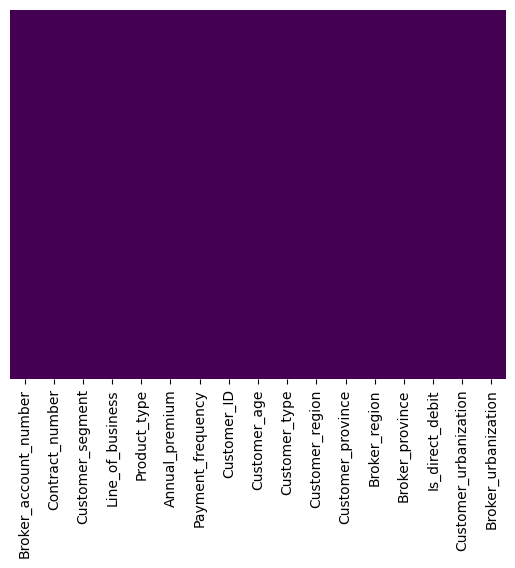

In [9]:
sns.heatmap(train.isnull(),yticklabels=False,cbar=False,cmap='viridis')

# No missing values across columns

In [13]:
# Remove duplicate rows
clean_data=train.drop_duplicates()

In [14]:
clean_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 452156 entries, 0 to 452219
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Broker_account_number  452156 non-null  object 
 1   Contract_number        452156 non-null  object 
 2   Customer_segment       452156 non-null  object 
 3   Line_of_business       452156 non-null  object 
 4   Product_type           452156 non-null  object 
 5   Annual_premium         452156 non-null  float64
 6   Payment_frequency      452156 non-null  object 
 7   Customer_ID            452156 non-null  int64  
 8   Customer_age           452156 non-null  object 
 9   Customer_type          452156 non-null  object 
 10  Customer_region        452156 non-null  object 
 11  Customer_province      452156 non-null  object 
 12  Broker_region          452156 non-null  object 
 13  Broker_province        452156 non-null  object 
 14  Is_direct_debit        452156 non-null  i

In [15]:
clean_data.columns

Index(['Broker_account_number', 'Contract_number', 'Customer_segment',
       'Line_of_business', 'Product_type', 'Annual_premium',
       'Payment_frequency', 'Customer_ID', 'Customer_age', 'Customer_type',
       'Customer_region', 'Customer_province', 'Broker_region',
       'Broker_province', 'Is_direct_debit', 'Customer_urbanization',
       'Broker_urbanization'],
      dtype='object')

<Axes: xlabel='Is_direct_debit', ylabel='count'>

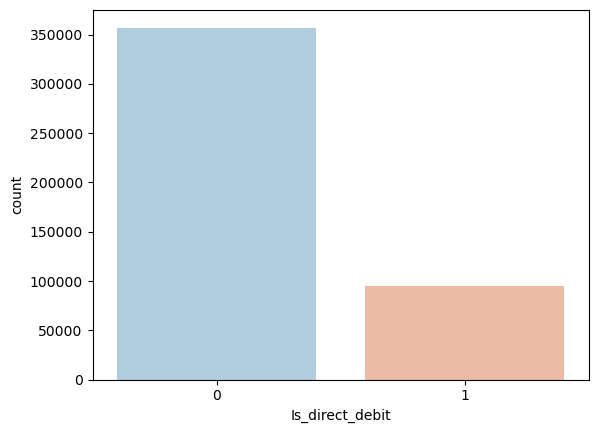

In [16]:
sns.countplot(x='Is_direct_debit',data=clean_data,palette='RdBu_r')

# 3,50,000 customers do not have direct debit. Only, 1,00,000 customers have direct debit.

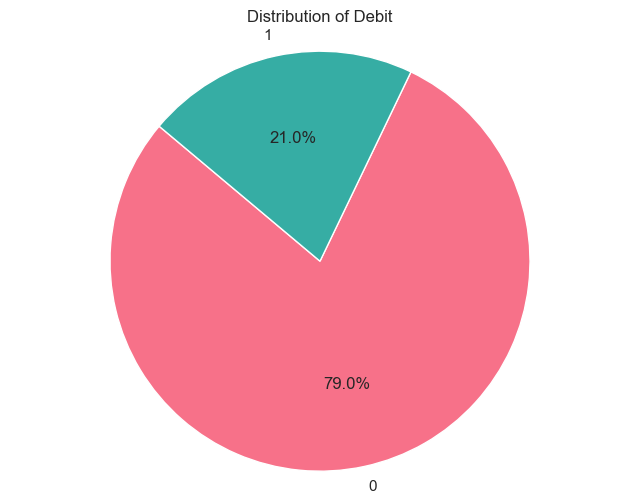

In [17]:
column_data = clean_data['Is_direct_debit']
value_counts = column_data.value_counts()
labels = value_counts.index
sizes = value_counts.values
sns.set(style="whitegrid")

# Plotting the Pie Chart
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("husl", len(labels)))
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of {}'.format('Debit'))
plt.show()

# 1 = Direct Debit
# 0 = No Direct Debit

In [18]:
import cufflinks as cf

In [19]:
cf.go_offline()

In [20]:
clean_data['Is_direct_debit'].iplot(kind='hist',bins=30,color='green')

In [21]:
import pandas as pd
from sklearn.utils import resample

In [22]:
# Identify the Minority and Majority Classes:
clean_data['Is_direct_debit'].value_counts()

Is_direct_debit
0    357121
1     95035
Name: count, dtype: int64

In [23]:
# Separate the Majority and Minority Classes:
majority_class = clean_data[clean_data['Is_direct_debit'] == 0]
minority_class = clean_data[clean_data['Is_direct_debit'] == 1]

In [24]:
# Upsample the Minority Class:
minority_class_upsampled = resample(minority_class, 
                                    replace=True,     # Sample with replacement
                                    n_samples=len(majority_class), # Match the number of majority class
                                    random_state=42)  # For reproducibility

In [25]:
# Combine the Upsampled Minority Class with the Original Majority Class:
upsampled_train = pd.concat([majority_class, minority_class_upsampled])

In [26]:
# Check the New Class Distribution:
upsampled_train['Is_direct_debit'].value_counts()

Is_direct_debit
0    357121
1    357121
Name: count, dtype: int64

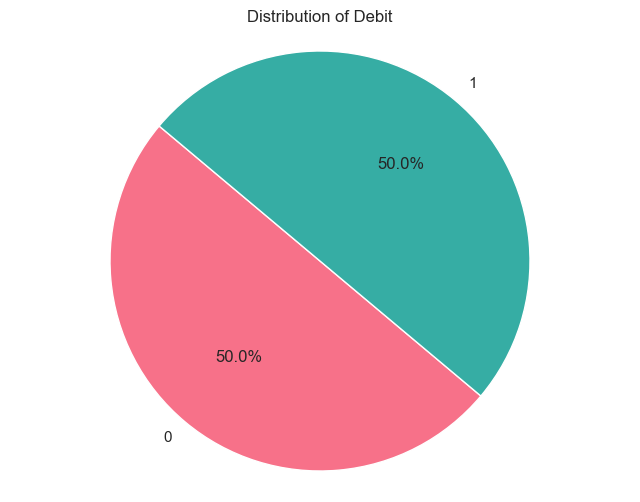

In [27]:
column_data = upsampled_train['Is_direct_debit']
value_counts = column_data.value_counts()
labels = value_counts.index
sizes = value_counts.values
sns.set(style="whitegrid")

# Plotting the Pie Chart
plt.figure(figsize=(8, 6))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("husl", len(labels)))
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Distribution of {}'.format('Debit'))
plt.show()

# 1 = Direct Debit
# 0 = No Direct Debit

In [28]:
import cufflinks as cf

In [29]:
cf.go_offline()

In [30]:
upsampled_train['Is_direct_debit'].iplot(kind='hist',bins=30,color='green')

<Axes: xlabel='Is_direct_debit', ylabel='count'>

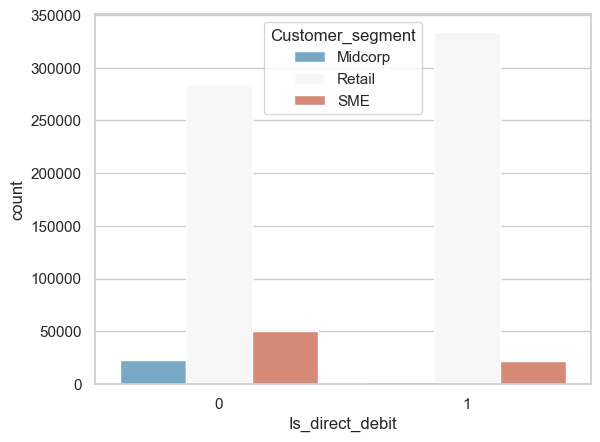

In [31]:
sns.countplot(x='Is_direct_debit',hue='Customer_segment',data=upsampled_train,palette='RdBu_r')

<Axes: xlabel='Is_direct_debit', ylabel='count'>

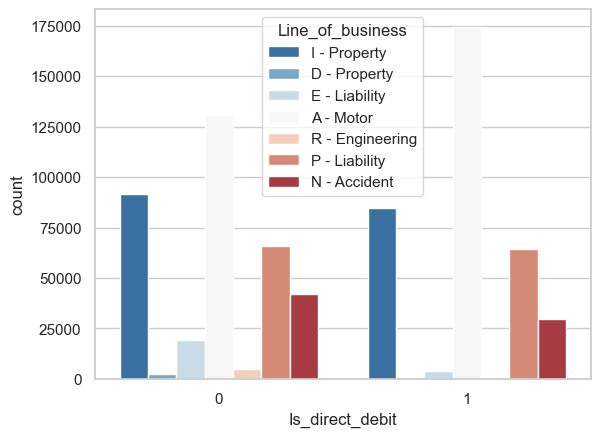

In [32]:
sns.countplot(x='Is_direct_debit',hue='Line_of_business',data=upsampled_train,palette='RdBu_r')

<Axes: xlabel='Is_direct_debit', ylabel='count'>

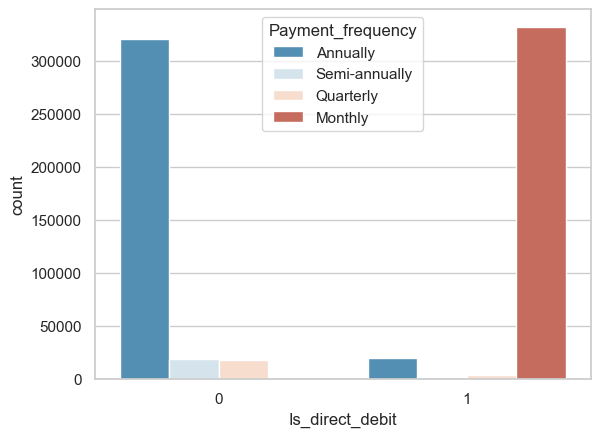

In [33]:
sns.countplot(x='Is_direct_debit',hue='Payment_frequency',data=upsampled_train,palette='RdBu_r')

<Axes: xlabel='Is_direct_debit', ylabel='count'>

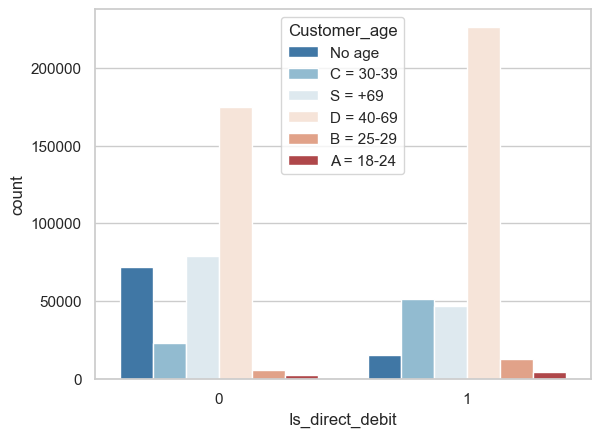

In [34]:
sns.countplot(x='Is_direct_debit',hue='Customer_age',data=upsampled_train,palette='RdBu_r')

<Axes: xlabel='Is_direct_debit', ylabel='count'>

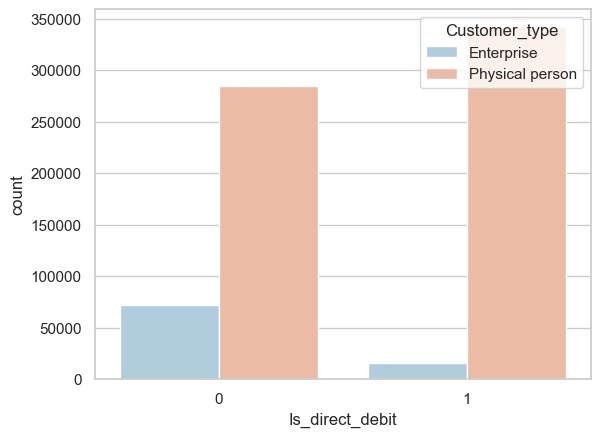

In [35]:
sns.countplot(x='Is_direct_debit',hue='Customer_type',data=upsampled_train,palette='RdBu_r')

<Axes: xlabel='Is_direct_debit', ylabel='count'>

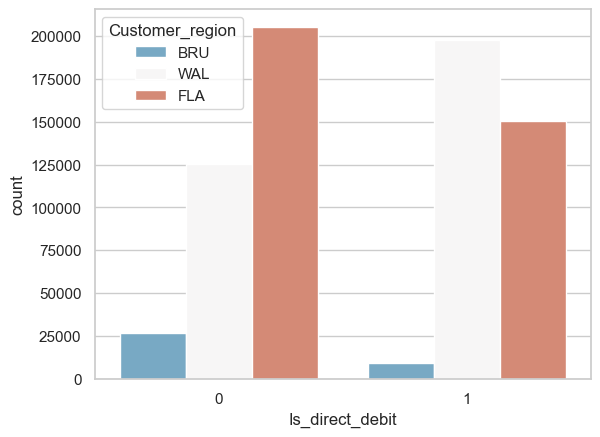

In [36]:
sns.countplot(x='Is_direct_debit',hue='Customer_region',data=upsampled_train,palette='RdBu_r')

Text(0.5, 1.0, 'Annual Premium Distribution by Customer Age')

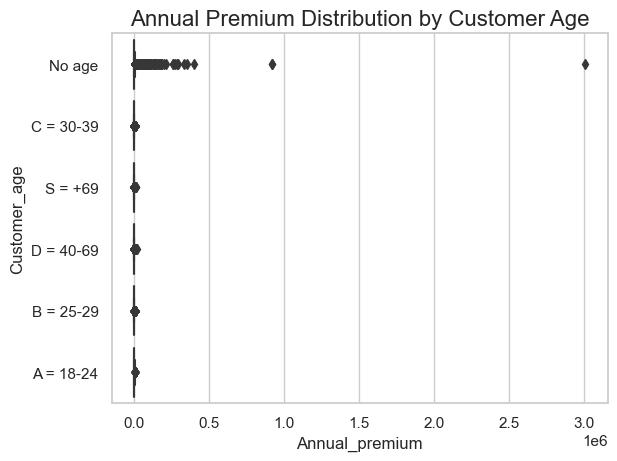

In [37]:
sns.boxplot(x='Annual_premium',y='Customer_age',data=upsampled_train,palette='winter')
plt.title('Annual Premium Distribution by Customer Age', fontsize=16)

Text(0.5, 1.0, 'Annual Premium Distribution by Customer Region')

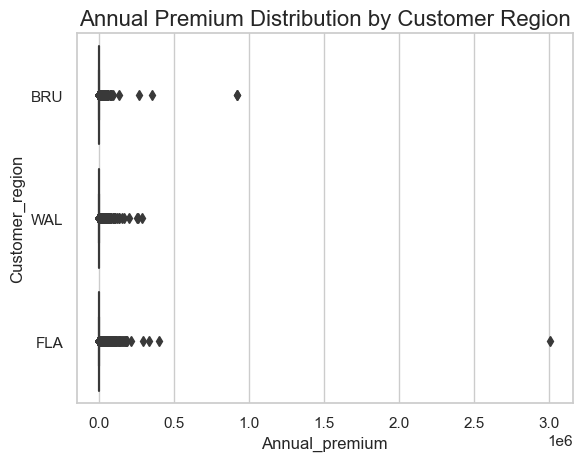

In [38]:
sns.boxplot(x='Annual_premium',y='Customer_region',data=upsampled_train,palette='winter')
plt.title('Annual Premium Distribution by Customer Region', fontsize=16)

Text(0.5, 1.0, 'Annual Premium Distribution by Customer Segment')

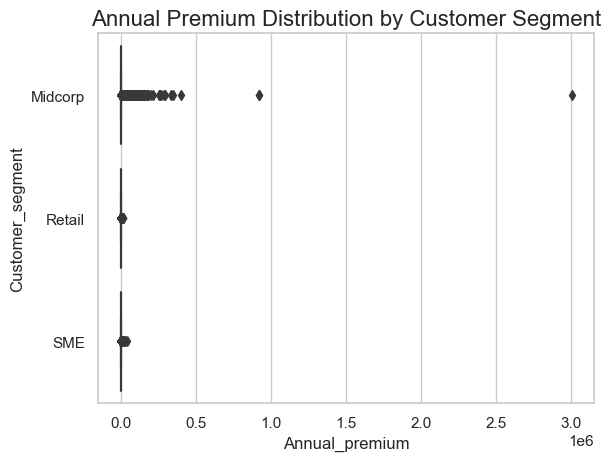

In [39]:
sns.boxplot(x='Annual_premium',y='Customer_segment',data=upsampled_train,palette='winter')
plt.title('Annual Premium Distribution by Customer Segment', fontsize=16)

In [40]:
upsampled_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 714242 entries, 0 to 111429
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Broker_account_number  714242 non-null  object 
 1   Contract_number        714242 non-null  object 
 2   Customer_segment       714242 non-null  object 
 3   Line_of_business       714242 non-null  object 
 4   Product_type           714242 non-null  object 
 5   Annual_premium         714242 non-null  float64
 6   Payment_frequency      714242 non-null  object 
 7   Customer_ID            714242 non-null  int64  
 8   Customer_age           714242 non-null  object 
 9   Customer_type          714242 non-null  object 
 10  Customer_region        714242 non-null  object 
 11  Customer_province      714242 non-null  object 
 12  Broker_region          714242 non-null  object 
 13  Broker_province        714242 non-null  object 
 14  Is_direct_debit        714242 non-null  i

In [41]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_segment)

Customer_segment,Midcorp,Retail,SME
Is_direct_debit,,,
0,23079,283656,50386
1,1541,334001,21579


In [42]:
from scipy.stats import chi2_contingency

In [43]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_segment))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Customer segment and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=34476.622299635055, pvalue=0.0, dof=2, expected_freq=array([[ 12310. , 308828.5,  35982.5],
       [ 12310. , 308828.5,  35982.5]]))

In [44]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Line_of_business)

Line_of_business,A - Motor,D - Property,E - Liability,I - Property,N - Accident,P - Liability,R - Engineering
Is_direct_debit,,,,,,,
0,130927,2302,19068,91836,42252,65650,5086
1,174356,66,3825,84736,29563,64211,364


In [45]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Line_of_business))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Line_of_business and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=25073.54095421482, pvalue=0.0, dof=6, expected_freq=array([[152641.5,   1184. ,  11446.5,  88286. ,  35907.5,  64930.5,
          2725. ],
       [152641.5,   1184. ,  11446.5,  88286. ,  35907.5,  64930.5,
          2725. ]]))

In [46]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Payment_frequency)

Payment_frequency,Annually,Monthly,Quarterly,Semi-annually
Is_direct_debit,,,,
0,320857,0,17457,18807
1,19878,332363,3309,1571


In [47]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Payment_frequency))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Payment_frequency and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=622442.1871675814, pvalue=0.0, dof=3, expected_freq=array([[170367.5, 166181.5,  10383. ,  10189. ],
       [170367.5, 166181.5,  10383. ,  10189. ]]))

In [48]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_age)

Customer_age,A = 18-24,B = 25-29,C = 30-39,D = 40-69,No age,S = +69
Is_direct_debit,,,,,,
0,2410,5530,23208,174979,72114,78880
1,4406,12971,51388,226173,15160,47023


In [49]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_age))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Customer_age and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=65984.23265486718, pvalue=0.0, dof=5, expected_freq=array([[  3408. ,   9250.5,  37298. , 200576. ,  43637. ,  62951.5],
       [  3408. ,   9250.5,  37298. , 200576. ,  43637. ,  62951.5]]))

In [50]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_type)

Customer_type,Enterprise,Physical person
Is_direct_debit,,
0,72114,285007
1,15160,341961


In [51]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_type))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Customer_type and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=42339.7548448953, pvalue=0.0, dof=1, expected_freq=array([[ 43637., 313484.],
       [ 43637., 313484.]]))

In [52]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_region)

Customer_region,BRU,FLA,WAL
Is_direct_debit,,,
0,26732,205227,125162
1,9076,150187,197858


In [53]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_region))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Customer_region and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=33589.6164002898, pvalue=0.0, dof=2, expected_freq=array([[ 17904., 177707., 161510.],
       [ 17904., 177707., 161510.]]))

In [54]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_province)

Customer_province,BRU,VAN,VBR,VLI,VOV,VWV,WBR,WHT,WLG,WNA
Is_direct_debit,,,,,,,,,,
0,26732,44314,14172,47397,39987,59357,12753,56871,35578,19960
1,9076,30993,6598,47626,27191,37779,7181,94993,55437,40247


In [55]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_province))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Customer_provice and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=43351.38263165249, pvalue=0.0, dof=9, expected_freq=array([[17904. , 37653.5, 10385. , 47511.5, 33589. , 48568. ,  9967. ,
        75932. , 45507.5, 30103.5],
       [17904. , 37653.5, 10385. , 47511.5, 33589. , 48568. ,  9967. ,
        75932. , 45507.5, 30103.5]]))

In [56]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Broker_region)

Broker_region,BRU,FLA,WAL
Is_direct_debit,,,
0,33696,204571,118854
1,15022,149866,192233


In [57]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Broker_region))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Broker_region and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=32909.83879273061, pvalue=0.0, dof=2, expected_freq=array([[ 24359. , 177218.5, 155543.5],
       [ 24359. , 177218.5, 155543.5]]))

In [58]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Broker_province)

Broker_province,BRU,PTS,VAN,VBR,VLI,VOV,VWV,WBR,WHT,WLG,WNA
Is_direct_debit,,,,,,,,,,,
0,33696,9313,43610,8226,45779,39120,58523,9229,53668,35674,20283
1,15022,6513,30364,3254,46399,26245,37091,6123,88050,55050,43010


In [59]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Broker_province))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 0.0 is less than 0.05, we reject the null hypothesis.
# Broker_province and Is_direct_debit are dependent.

Chi2ContingencyResult(statistic=40791.34682570226, pvalue=0.0, dof=10, expected_freq=array([[24359. ,  7913. , 36987. ,  5740. , 46089. , 32682.5, 47807. ,
         7676. , 70859. , 45362. , 31646.5],
       [24359. ,  7913. , 36987. ,  5740. , 46089. , 32682.5, 47807. ,
         7676. , 70859. , 45362. , 31646.5]]))

In [60]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_urbanization)

Customer_urbanization,Rural,Urban
Is_direct_debit,,
0,304295,52826
1,311610,45511


In [61]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Customer_urbanization))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value 3.26908 is greater than 0.05, we fail to reject the null hypothesis.
# Customer_urbanization and Is_direct_debit are independent.

Chi2ContingencyResult(statistic=630.8478277207969, pvalue=3.2690892903514576e-139, dof=1, expected_freq=array([[307952.5,  49168.5],
       [307952.5,  49168.5]]))

In [62]:
pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Broker_urbanization)

Broker_urbanization,Rural,Urban
Is_direct_debit,,
0,301760,55361
1,303648,53473


In [63]:
chi2_contingency(pd.crosstab(upsampled_train.Is_direct_debit,upsampled_train.Broker_urbanization))

# Null: There is no association between both variables (both variables are independent)
# Alt: There is association between both variables (both variables are dependent)
# Since p-value=5.2044 is greater than 0.05, we fail to reject the null hypothesis.
# Broker_urbanization and Is_direct_debit are independent.

Chi2ContingencyResult(statistic=38.59903421168863, pvalue=5.204467019166918e-10, dof=1, expected_freq=array([[302704.,  54417.],
       [302704.,  54417.]]))

In [64]:
upsampled_train.dropna(inplace=True)

In [65]:
upsampled_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 714242 entries, 0 to 111429
Data columns (total 17 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   Broker_account_number  714242 non-null  object 
 1   Contract_number        714242 non-null  object 
 2   Customer_segment       714242 non-null  object 
 3   Line_of_business       714242 non-null  object 
 4   Product_type           714242 non-null  object 
 5   Annual_premium         714242 non-null  float64
 6   Payment_frequency      714242 non-null  object 
 7   Customer_ID            714242 non-null  int64  
 8   Customer_age           714242 non-null  object 
 9   Customer_type          714242 non-null  object 
 10  Customer_region        714242 non-null  object 
 11  Customer_province      714242 non-null  object 
 12  Broker_region          714242 non-null  object 
 13  Broker_province        714242 non-null  object 
 14  Is_direct_debit        714242 non-null  i

In [66]:
# Customer_segment
Segment=pd.get_dummies(upsampled_train['Customer_segment'],drop_first=True)

In [67]:
# Line_of_business
Business=pd.get_dummies(upsampled_train['Line_of_business'],drop_first=True)

In [68]:
# Payment_frequency
Frequency=pd.get_dummies(upsampled_train['Payment_frequency'],drop_first=True)

In [69]:
# Customer_age
Age=pd.get_dummies(upsampled_train['Customer_age'],drop_first=True)

In [70]:
# Customer_type
Type=pd.get_dummies(upsampled_train['Customer_type'],drop_first=True)

In [71]:
# Customer_region
CRegion=pd.get_dummies(upsampled_train['Customer_region'],drop_first=True)

In [72]:
upsampled_train.drop(['Broker_account_number','Contract_number','Customer_segment','Line_of_business','Product_type','Payment_frequency','Customer_ID','Customer_age','Customer_type','Customer_region','Customer_province','Broker_region','Broker_province','Customer_urbanization','Broker_urbanization'],axis=1,inplace=True)

In [73]:
upsampled_train = pd.concat([upsampled_train,Segment,Frequency,Age,Type,CRegion],axis=1)

In [74]:
upsampled_train.head()

,Annual_premium,Is_direct_debit,Retail,SME,Monthly,Quarterly,Semi-annually,B = 25-29,C = 30-39,D = 40-69,No age,S = +69,Physical person,FLA,WAL
0,2632.45,0,False,False,False,False,False,False,False,False,True,False,False,False,False
1,4996.78,0,False,False,False,False,False,False,False,False,True,False,False,False,False
2,1734.62,0,False,False,False,False,False,False,False,False,True,False,False,False,False
3,2460.68,0,False,False,False,False,False,False,False,False,True,False,False,False,False
4,7731.46,0,False,False,False,False,False,False,False,False,True,False,False,False,False


In [75]:
# Training data 99%:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(upsampled_train.drop('Is_direct_debit',axis=1), 
                                                    upsampled_train['Is_direct_debit'], test_size=0.01, 
                                                    random_state=101)

In [76]:
from sklearn.linear_model import LogisticRegression

In [77]:
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

C:\Users\Sai Bharadwaja\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [78]:
predictions = logmodel.predict(X_test)

In [79]:
from sklearn.metrics import classification_report

In [80]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.93      1.00      0.96      3552
           1       1.00      0.93      0.96      3591

    accuracy                           0.96      7143
   macro avg       0.97      0.96      0.96      7143
weighted avg       0.97      0.96      0.96      7143



In [81]:
# Train-Test Split of 70% and 30%:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(upsampled_train.drop('Is_direct_debit',axis=1), 
                                                    upsampled_train['Is_direct_debit'], test_size=0.30, 
                                                    random_state=101)

In [82]:
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

C:\Users\Sai Bharadwaja\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [83]:
predictions = logmodel.predict(X_test)

In [84]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.94      1.00      0.97    107373
           1       1.00      0.93      0.96    106900

    accuracy                           0.97    214273
   macro avg       0.97      0.97      0.97    214273
weighted avg       0.97      0.97      0.97    214273



In [85]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier

In [86]:
dtree = DecisionTreeClassifier()

In [87]:
dtree.fit(X_train,y_train)

DecisionTreeClassifier()

In [88]:
X = upsampled_train.drop('Is_direct_debit',axis=1)
y = upsampled_train['Is_direct_debit']

In [89]:
# Training 99% Data:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.01)

In [90]:
predictions = dtree.predict(X_test)

In [91]:
from sklearn.metrics import classification_report,confusion_matrix

In [92]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      3568
           1       0.99      0.98      0.99      3575

    accuracy                           0.99      7143
   macro avg       0.99      0.99      0.99      7143
weighted avg       0.99      0.99      0.99      7143



In [93]:
print(confusion_matrix(y_test,predictions))

[[3545   23]
 [  78 3497]]


In [94]:
# Train-Test Split of 70% and 30%
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [95]:
predictions = dtree.predict(X_test)

In [96]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99    107178
           1       0.99      0.98      0.98    107095

    accuracy                           0.99    214273
   macro avg       0.99      0.99      0.99    214273
weighted avg       0.99      0.99      0.99    214273



In [97]:
print(confusion_matrix(y_test,predictions))

[[106279    899]
 [  2306 104789]]


In [98]:
# Random Forest:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(X_train, y_train)

RandomForestClassifier()

In [99]:
rfc_pred = rfc.predict(X_test)

In [100]:
print(confusion_matrix(y_test,rfc_pred))

[[105067   2111]
 [  2617 104478]]


In [101]:
print(classification_report(y_test,rfc_pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98    107178
           1       0.98      0.98      0.98    107095

    accuracy                           0.98    214273
   macro avg       0.98      0.98      0.98    214273
weighted avg       0.98      0.98      0.98    214273



In [102]:
# Get the name of the column in the 2nd position
col_to_move = 'Is_direct_debit'

# Create a new column order: all columns except 'Is_direct_debit', then add 'Is_direct_debit' at the end
new_column_order = [col for col in upsampled_train.columns if col != col_to_move] + [col_to_move]

# Reorder the DataFrame
upsampled_train = upsampled_train[new_column_order]

In [103]:
upsampled_train.head()

,Annual_premium,Retail,SME,Monthly,Quarterly,Semi-annually,B = 25-29,C = 30-39,D = 40-69,No age,S = +69,Physical person,FLA,WAL,Is_direct_debit
0,2632.45,False,False,False,False,False,False,False,False,True,False,False,False,False,0
1,4996.78,False,False,False,False,False,False,False,False,True,False,False,False,False,0
2,1734.62,False,False,False,False,False,False,False,False,True,False,False,False,False,0
3,2460.68,False,False,False,False,False,False,False,False,True,False,False,False,False,0
4,7731.46,False,False,False,False,False,False,False,False,True,False,False,False,False,0


In [104]:
from sklearn.preprocessing import StandardScaler

In [105]:
scaler = StandardScaler()

In [106]:
scaler.fit(upsampled_train.drop('Is_direct_debit',axis=1))

StandardScaler()

In [107]:
scaled_features = scaler.transform(upsampled_train.drop('Is_direct_debit',axis=1))

In [108]:
df_feat = pd.DataFrame(scaled_features,columns=upsampled_train.columns[:-1])

In [109]:
df_feat.head()

,Annual_premium,Retail,SME,Monthly,Quarterly,Semi-annually,B = 25-29,C = 30-39,D = 40-69,No age,S = +69,Physical person,FLA,WAL
0,0.50,-2.53,-0.33,-0.93,-0.17,-0.17,-0.16,-0.34,-1.13,2.68,-0.46,-2.68,-1.00,-0.91
1,1.04,-2.53,-0.33,-0.93,-0.17,-0.17,-0.16,-0.34,-1.13,2.68,-0.46,-2.68,-1.00,-0.91
2,0.29,-2.53,-0.33,-0.93,-0.17,-0.17,-0.16,-0.34,-1.13,2.68,-0.46,-2.68,-1.00,-0.91
3,0.46,-2.53,-0.33,-0.93,-0.17,-0.17,-0.16,-0.34,-1.13,2.68,-0.46,-2.68,-1.00,-0.91
4,1.68,-2.53,-0.33,-0.93,-0.17,-0.17,-0.16,-0.34,-1.13,2.68,-0.46,-2.68,-1.00,-0.91


In [110]:
from sklearn.model_selection import train_test_split

In [111]:
# 99% Training Data:
X_train, X_test, y_train, y_test = train_test_split(scaled_features,upsampled_train['Is_direct_debit'],
                                                    test_size=0.01)

In [112]:
from sklearn.neighbors import KNeighborsClassifier

In [113]:
knn = KNeighborsClassifier(n_neighbors=1)

In [114]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [115]:
pred = knn.predict(X_test)

In [116]:
# Predictions and Evaluations of KNN for 99% Training Data
from sklearn.metrics import classification_report,confusion_matrix

In [117]:
print(confusion_matrix(y_test,pred))

[[3545   90]
 [  77 3431]]


In [118]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3635
           1       0.97      0.98      0.98      3508

    accuracy                           0.98      7143
   macro avg       0.98      0.98      0.98      7143
weighted avg       0.98      0.98      0.98      7143



In [119]:
# Train-Test Split of 80% and 20% Data:
X_train, X_test, y_train, y_test = train_test_split(scaled_features,upsampled_train['Is_direct_debit'],
                                                    test_size=0.20)

In [120]:
knn = KNeighborsClassifier(n_neighbors=1)

In [121]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

In [122]:
pred = knn.predict(X_test)

In [123]:
# Predictions and Evaluations of KNN for 80:20 split of Train and Test Data
from sklearn.metrics import classification_report,confusion_matrix

In [124]:
print(confusion_matrix(y_test,pred))

[[69078  2366]
 [ 1662 69743]]


In [125]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.98      0.97      0.97     71444
           1       0.97      0.98      0.97     71405

    accuracy                           0.97    142849
   macro avg       0.97      0.97      0.97    142849
weighted avg       0.97      0.97      0.97    142849



In [126]:
# Choosing K Value:
error_rate = []

# Will take some time
for i in range(1,10):
    
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

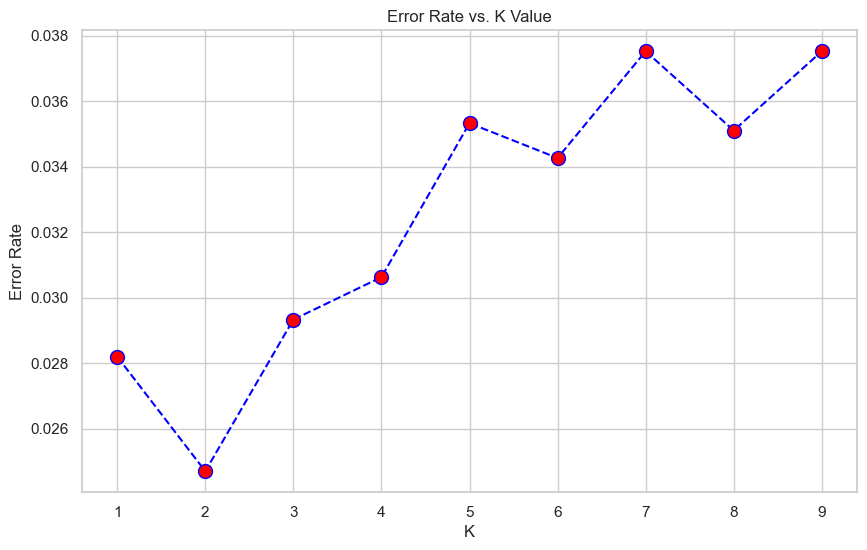

In [127]:
plt.figure(figsize=(10,6))
plt.plot(range(1,10),error_rate,color='blue', linestyle='dashed', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [128]:
# FIRST A QUICK COMPARISON TO OUR ORIGINAL K=1
knn = KNeighborsClassifier(n_neighbors=1)

knn.fit(X_train,y_train)
pred = knn.predict(X_test)

print('WITH K=1')
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))

WITH K=1


[[69078  2366]
 [ 1662 69743]]


              precision    recall  f1-score   support

           0       0.98      0.97      0.97     71444
           1       0.97      0.98      0.97     71405

    accuracy                           0.97    142849
   macro avg       0.97      0.97      0.97    142849
weighted avg       0.97      0.97      0.97    142849



In [129]:
# NOW WITH K=7
knn = KNeighborsClassifier(n_neighbors=23)

knn.fit(X_train,y_train)
pred = knn.predict(X_test)

print('WITH K=7')
print('\n')
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))

WITH K=7


[[71278   166]
 [ 4839 66566]]


              precision    recall  f1-score   support

           0       0.94      1.00      0.97     71444
           1       1.00      0.93      0.96     71405

    accuracy                           0.96    142849
   macro avg       0.97      0.96      0.96    142849
weighted avg       0.97      0.96      0.96    142849

